# Dataset generation

In [1]:
import matplotlib.pyplot as plt
import random

In [2]:
s = 10000
bl = 20
br = 500

In [3]:
# this is for creating a file type reference to the dataset
# also to handle exceptions
# absolute path or direct file name
def readData(fileN):  
    x=[]
    y=[]
    with open(fileN, 'r') as file:
        for line in file:
    #         print(line)
            temp = line.split('\t')
    #         print(len(temp))
    #         print(temp[2])
            x.append(float(temp[0]))
            y.append(float(temp[1]))
    return x,y

In [4]:
def scale(x,y,s):
    xmin = min(x)
    ymin = min(y)
    rangex = max(x)-min(x)
    rangey = max(y)-min(y)
    x = list(map(lambda x1: ((x1-xmin)*s)/rangex, x))
    y = list(map(lambda y1: ((y1-ymin)*s)/rangey, y))
    return x, y

def translate(x, y, xtrans, ytrans):
    x = list(map(lambda x: x+xtrans,x))
    y = list(map(lambda y: y+ytrans,y)) 
    return x,y

In [5]:
x1,y1 = readData('dataset/shapes.txt')
x2,y2 = readData('dataset/jain.txt')
x3,y3 = readData('dataset/r15.txt')
x4,y4 = readData('dataset/compound.txt')

In [6]:
# for merging the datasets
# top left r15, top right jain
# bottom left compound, bottom right aggregation
# random points for noise
    
# scaling is needed
# r15
x2,y2 = scale(x2, y2,s)

# jain
x4,y4 = scale(x4, y4,s)

# compound
x3,y3 = scale(x3, y3,s)

# aggregate
x1, y1 = scale(x1, y1,s)

In [7]:
# translation
# r15
x2,y2 = translate(x2,y2, 0, s+s/10)

# jain
x4,y4 = translate(x4, y4, s+s/10, s+s/10)

# compound
x3,y3 = translate(x3, y3, 0, 0)

# aggregate
x1,y1 = translate(x1, y1, s+s/10, 0)

In [8]:
x = x1+x2+x3+x4
y = y1+y2+y3+y4

lenx = len(x)//10
for i in range(lenx):
    x.append(random.random()*2*s)
    y.append(random.random()*2*s)
x, y = scale(x,y,s-1)

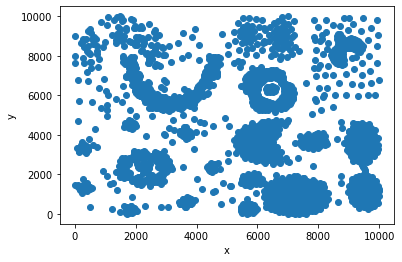

In [9]:
plt.scatter(x,y)
plt.xlabel('x')
plt.ylabel('y')
plt.savefig('dataset/image.svg')

In [10]:
final=[]
for i in range(len(x)):
    batch=[]
    b = random.randint(bl,br)
    while b!=0 and i<len(x):
        batch.append(tuple([x[i], y[i]]))
        b-=1
        i+=1
    random.shuffle(batch)
    final.append(batch)
random.shuffle(final)
final

[[(5467.03786574871, 367.61029411764696),
  (5574.600258175559, 262.5787815126051),
  (8299.514199655765, 3544.8135504201687),
  (5488.550344234079, 420.126050420168),
  (5531.575301204819, 131.28939075630257),
  (8077.218588640277, 3614.83455882353),
  (8005.510327022375, 3352.2557773109247),
  (5667.820998278829, 0.0),
  (5918.799913941481, 280.08403361344534),
  (5911.62908777969, 140.04201680672267),
  (8184.780981067125, 3763.6292016806724),
  (5538.7461273666095, 507.65231092436966),
  (5725.18760757315, 218.81565126050424),
  (5854.26247848537, 35.01050420168067),
  (5789.72504302926, 516.4049369747898),
  (11.74211731548353, 8010.290877796901),
  (8070.047762478486, 3457.287289915967),
  (5696.50430292599, 542.6628151260503),
  (7940.972891566265, 3579.824054621849),
  (5495.721170395869, 262.5787815126051),
  (5725.18760757315, 61.26838235294116),
  (5588.941910499139, 358.85766806722694),
  (5646.30851979346, 402.6207983193278),
  (5603.28356282272, 78.77363445378151),
  (588

In [11]:
with open('dataset/Dataset '+str(s)+'-'+str(bl)+'-'+str(br)+'.txt', 'w') as f:
    for i in final:
        for j in range(len(i)):
            if(j != len(i)-1):
                st = str(i[j][0])+","+str(i[j][1])+"\t"
            else:
                st = str(i[j][0])+","+str(i[j][1])
            f.write(st)
        f.write("\n")